In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import csv
from collections import defaultdict
import os
import numpy as np
import os
import matplotlib.pyplot as plt

import requests

import json
import urllib
import zipfile
from PIL import ImageDraw
from PIL import Image
import json
import random
import shutil
import urllib
import zipfile
import requests
def draw_box(draw,top_left, bot_right):
  """Draws the bounding box and label for each object."""
  draw.rectangle([top_left, bot_right], width=3,
                   outline='red')
   

In [2]:
ann_bbox_path = "./google/validation-annotations-bbox.csv"
path = "./google/validation-annotations-human-imagelabels-boxable.csv"
img_folder = "./google/validation/"
classes_file_path = './google/class-descriptions-boxable.csv'
COCO_CLASSES_URL = "https://raw.githubusercontent.com/amikelive/coco-labels/master/coco-labels-2014_2017.txt"
input_data_path = "./ADE20K/code/ADE20K_2016_07_26"

# Load classes

In [3]:
def load_google_class(classes_file_path):
    GOOGLE_CLASSES = {}
    GOOGLE_CLASSES_reverse = {}
    with open(classes_file_path, 'r') as csvfile:
        spamreader = csv.reader(csvfile)#, delimiter=' ', quotechar='|')
        for i,row in enumerate(spamreader):
            GOOGLE_CLASSES[row[1].lower()] = row[0]
            GOOGLE_CLASSES_reverse[row[0]] = row[1].lower()
    return GOOGLE_CLASSES, GOOGLE_CLASSES_reverse
GOOGLE_CLASSES, GOOGLE_CLASSES_reverse =load_google_class(classes_file_path)
list(GOOGLE_CLASSES.keys())

['tortoise',
 'container',
 'magpie',
 'sea turtle',
 'football',
 'ambulance',
 'ladder',
 'toothbrush',
 'syringe',
 'sink',
 'toy',
 'organ (musical instrument)',
 'cassette deck',
 'apple',
 'human eye',
 'cosmetics',
 'paddle',
 'snowman',
 'beer',
 'chopsticks',
 'human beard',
 'bird',
 'parking meter',
 'traffic light',
 'croissant',
 'cucumber',
 'radish',
 'towel',
 'doll',
 'skull',
 'washing machine',
 'glove',
 'tick',
 'belt',
 'sunglasses',
 'banjo',
 'cart',
 'ball',
 'backpack',
 'bicycle',
 'home appliance',
 'centipede',
 'boat',
 'surfboard',
 'boot',
 'headphones',
 'hot dog',
 'shorts',
 'fast food',
 'bus',
 'boy',
 'screwdriver',
 'bicycle wheel',
 'barge',
 'laptop',
 'miniskirt',
 'drill (tool)',
 'dress',
 'bear',
 'waffle',
 'pancake',
 'brown bear',
 'woodpecker',
 'blue jay',
 'pretzel',
 'bagel',
 'tower',
 'teapot',
 'person',
 'bow and arrow',
 'swimwear',
 'beehive',
 'brassiere',
 'bee',
 'bat (animal)',
 'starfish',
 'popcorn',
 'burrito',
 'chainsaw

In [4]:
COCO_ANN_URL = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
def load_COCO(COCO_ANN_URL, tmp_path):
    import json
    zip_path, hdrs = urllib.request.urlretrieve(COCO_ANN_URL, os.path.join(tmp_path, 
                                                                           "annotations_trainval2017.zip"))
    #logger.info(f"Extracting {zip_path} to temporary folder {tmp_path}...")
    print(f"Extracting {zip_path} to temporary folder {tmp_path}...")
    with zipfile.ZipFile(f"{zip_path}", 'r') as z:
        z.extractall(f"{tmp_path}")
    annot_json_path =  os.path.join(tmp_path, 
                                    "annotations", "instances_val2017.json")
    categories = json.load(open(annot_json_path, 'r'))['categories']
    ids = list(map(lambda d: d['id'], categories))
    labels = list(map(lambda d: d['name'], categories))
    COCO_CLASSES_reverse = dict(zip(ids, labels))
    COCO_CLASSES = dict(zip(labels, ids))
    return COCO_CLASSES, COCO_CLASSES_reverse
COCO_CLASSES, COCO_CLASSES_reverse =load_COCO(COCO_ANN_URL,"./tmp")

Extracting ./tmp/annotations_trainval2017.zip to temporary folder ./tmp...


In [5]:
COCO_CLASSES

{'person': 1,
 'bicycle': 2,
 'car': 3,
 'motorcycle': 4,
 'airplane': 5,
 'bus': 6,
 'train': 7,
 'truck': 8,
 'boat': 9,
 'traffic light': 10,
 'fire hydrant': 11,
 'stop sign': 13,
 'parking meter': 14,
 'bench': 15,
 'bird': 16,
 'cat': 17,
 'dog': 18,
 'horse': 19,
 'sheep': 20,
 'cow': 21,
 'elephant': 22,
 'bear': 23,
 'zebra': 24,
 'giraffe': 25,
 'backpack': 27,
 'umbrella': 28,
 'handbag': 31,
 'tie': 32,
 'suitcase': 33,
 'frisbee': 34,
 'skis': 35,
 'snowboard': 36,
 'sports ball': 37,
 'kite': 38,
 'baseball bat': 39,
 'baseball glove': 40,
 'skateboard': 41,
 'surfboard': 42,
 'tennis racket': 43,
 'bottle': 44,
 'wine glass': 46,
 'cup': 47,
 'fork': 48,
 'knife': 49,
 'spoon': 50,
 'bowl': 51,
 'banana': 52,
 'apple': 53,
 'sandwich': 54,
 'orange': 55,
 'broccoli': 56,
 'carrot': 57,
 'hot dog': 58,
 'pizza': 59,
 'donut': 60,
 'cake': 61,
 'chair': 62,
 'couch': 63,
 'potted plant': 64,
 'bed': 65,
 'dining table': 67,
 'toilet': 70,
 'tv': 72,
 'laptop': 73,
 'mouse'

# Load annotations

In [31]:
"0001eeaf4aed83f9.jpg" in os.listdir("./google/google/validation/")

True

In [35]:
os.path.exists("./google/google/validation/0001eeaf4aed83f9.jpg")

True

In [36]:
os.path.exists(os.path.join("./google/google/validation/","0001eeaf4aed83f9" + ".jpg"))

True

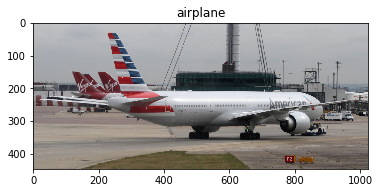

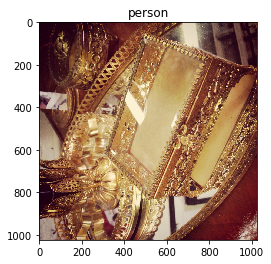

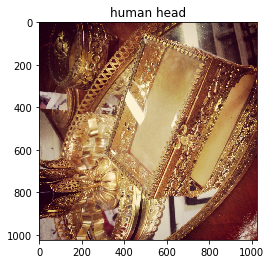

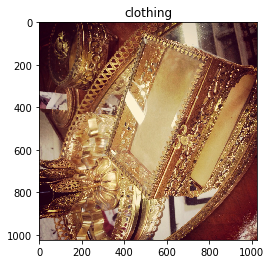

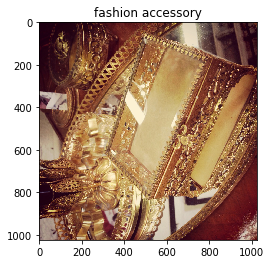

...

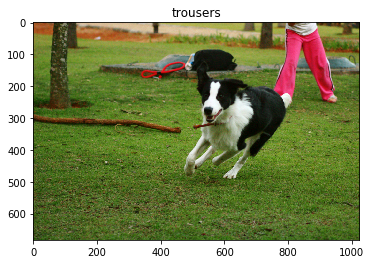

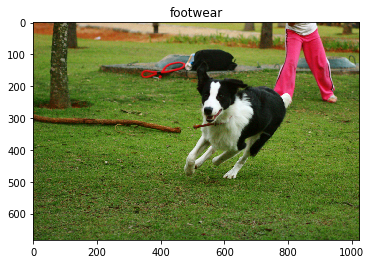

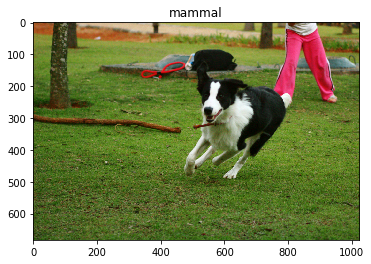

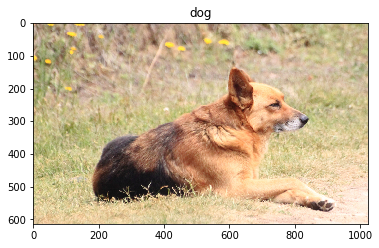

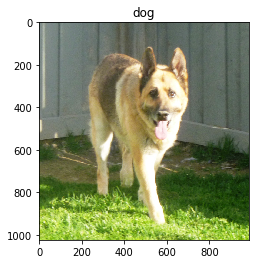

In [39]:

def load_annot_img_level(plot=True):
    ann_img_annot_url = "https://storage.googleapis.com/openimages/2018_04/validation/validation-images-with-rotation.csv"
    ann_annot_path = "./google/validation-annotations-human-imagelabels-boxable.csv"
   # ann_annot_path = "./google/validation-annotations-human-imagelabels.csv"
    with open(ann_annot_path, 'r') as csvfile:
        spamreader = csv.reader(csvfile)#, delimiter=' ', quotechar='|')
        for i,row in enumerate(spamreader):
            
            if 1<= i<30:
                if plot:
                    img_path = os.path.join("./google/google/validation/", row[0] + ".jpg")
                    if os.path.exists(img_path):
                        img = plt.imread(img_path)
                        plt.figure()
                        plt.imshow(img)
                        if row[2] in GOOGLE_CLASSES_reverse:
                            plt.title(GOOGLE_CLASSES_reverse[row[2]])
load_annot_img_level()
    

# Intersecting classes

In [6]:
def intersecting_classes(DATASET_CLASSES, COCO_CLASSES):
    intersecting_data_class= set()
    intersecting_coco = set()
    intersecting_data_idx = set()
    mapping_data_coco = {}
    for data_class in DATASET_CLASSES.keys():
        for data_single_class in data_class.split(", "):
            for coco_class in COCO_CLASSES.keys():
                for coco_single_class in coco_class.split(", "):
                    if data_single_class.lower() == coco_single_class:
                        intersecting_data_class.add(data_class)
                        intersecting_data_idx.add(DATASET_CLASSES[data_class])
                        intersecting_coco.add(coco_class)
                        mapping_data_coco[DATASET_CLASSES[data_class]] = coco_class
    return intersecting_data_class, intersecting_coco, intersecting_data_idx, mapping_data_coco
intersecting_g_class, intersecting_coco, intersecting_g_idx, mapping_g_coco = intersecting_classes(DATASET_CLASSES=GOOGLE_CLASSES,
                                                                                                  COCO_CLASSES=COCO_CLASSES)

In [7]:
# COCO class which are not in intersecting classes
for coco_class in COCO_CLASSES.keys():
    if coco_class not in intersecting_coco:
        print("Coco class:" , coco_class)
        for g_class in GOOGLE_CLASSES.keys():
            coco_split = coco_class.split(" ")
            for el in coco_split:
                if el in g_class:
                    print("*** may correspond to:", g_class)

Coco class: cow
*** may correspond to: cowboy hat
Coco class: frisbee
Coco class: skis
Coco class: sports ball
*** may correspond to: football
*** may correspond to: ball
*** may correspond to: balloon
*** may correspond to: cricket ball
*** may correspond to: volleyball (ball)
*** may correspond to: baseball bat
*** may correspond to: baseball glove
*** may correspond to: golf ball
*** may correspond to: tennis ball
*** may correspond to: sports equipment
*** may correspond to: football helmet
*** may correspond to: sports uniform
*** may correspond to: rugby ball
Coco class: cup
*** may correspond to: coffee cup
*** may correspond to: cupboard
*** may correspond to: measuring cup
*** may correspond to: porcupine
Coco class: donut
Coco class: potted plant
*** may correspond to: houseplant
*** may correspond to: lavender (plant)
*** may correspond to: plant
*** may correspond to: squash (plant)
Coco class: dining table
*** may correspond to: table
*** may correspond to: tableware
*** m

# Create annotation dict google

In [11]:
with open(ann_bbox_path, 'r') as csvfile:
    spamreader = csv.reader(csvfile)#, delimiter=' ', quotechar='|')
    for i,row in enumerate(spamreader):
        if i< 10 :
            print(row)

['ImageID', 'Source', 'LabelName', 'Confidence', 'XMin', 'XMax', 'YMin', 'YMax', 'IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction', 'IsInside']
['0001eeaf4aed83f9', 'xclick', '/m/0cmf2', '1', '0.022673031', '0.9642005', '0.07103825', '0.80054647', '0', '0', '0', '0', '0']
['000595fe6fee6369', 'xclick', '/m/02wbm', '1', '0', '1', '0', '1', '0', '0', '1', '0', '0']
['000595fe6fee6369', 'xclick', '/m/02xwb', '1', '0.1413844', '0.179676', '0.67627496', '0.73170733', '0', '0', '0', '0', '0']
['000595fe6fee6369', 'xclick', '/m/02xwb', '1', '0.21354933', '0.2533137', '0.29933482', '0.35476717', '1', '0', '0', '0', '0']
['000595fe6fee6369', 'xclick', '/m/02xwb', '1', '0.23269513', '0.28865978', '0.49002218', '0.54545456', '1', '0', '0', '0', '0']
['000595fe6fee6369', 'xclick', '/m/02xwb', '1', '0.24594992', '0.2916053', '0.54767185', '0.6053215', '1', '0', '0', '0', '0']
['000595fe6fee6369', 'xclick', '/m/02xwb', '1', '0.24594992', '0.29013255', '0.6607539', '0.7161862', '1', '0', '0', '

In [ ]:
ann_bbox_path

In [8]:
def create_ann(ann_bbox_csv, params=None):
    """
    keeps all images with params
    """
    tmp = dict(zip(['IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction', 'IsInside'],
                          ["01" for i in range(5)]))
    if params is None:
        params = tmp
    else:
        for key in params.keys():
            tmp[key] = params[key]
        params = tmp
        
    ann_dict = {}
    with open(ann_bbox_csv, 'r') as csvfile:
        spamreader = csv.reader(csvfile)#, delimiter=' ', quotechar='|')
        for i,row in enumerate(spamreader):
            if i == 0:
                _c = dict(zip(row, [j for j in range(len(row))]))
            else:
                img_id = row[0] + ".jpg"
                keep = True
                for attribute in params.keys():
                    if row[_c[attribute]] not in params[attribute]:
                        keep = False
                if img_id not in ann_dict:
                    ann_dict[img_id] = {}
                    obj_id = 1
                    ann_dict[img_id]['keep'] = keep
                else:
                    obj_id = ann_dict[img_id]['nb_obj_so_far'] + 1
                if not keep:
                    ann_dict[img_id]['keep'] = keep
                ann_dict[img_id]['nb_obj_so_far'] = obj_id
                ann_dict[img_id][f'obj_id_{obj_id:03}'] = {}
                ann_dict[img_id][f'obj_id_{obj_id:03}']["label_name"] = row[2]
                ann_dict[img_id][f'obj_id_{obj_id:03}']["nbbox"] = [float(row[6]), float(row[7]), float(row[4]), float(row[5])] #top,bot, left, right
    all_img = list(ann_dict.keys())
    for img_id in all_img:
        if not ann_dict[img_id]['keep']:
            del ann_dict[img_id]
    return ann_dict

# Plot function

In [9]:
def plot_bbox(annot, folder_img_path, list_given_img=None):
    all_img_annot_key = list(annot.keys())
    c = 0
    if list_given_img is None:
        list_given_img = all_img_annot_key
        
    for i_img, img_name in enumerate(all_img_annot_key):
        img_path = os.path.join(folder_img_path, img_name)
        if c < 60 and os.path.exists(img_path) and img_name in list_given_img:
            c+=1
            img = plt.imread(img_path)
            N,M = img.shape[0], img.shape[1]
            plt.figure()
            title = ""
            image = Image.open(img_path)
            for k_obj, obj in enumerate(annot[img_name].keys()):
                if obj.startswith('obj_id'):
                    google_label = GOOGLE_CLASSES_reverse[annot[img_name][obj]['label_name']]
                    #coco_label = annot[img_name][obj]["class_id"]
                
                    bbox = annot[img_name][obj]["nbbox"]
                    title += google_label#str(coco_label) 

                    if k_obj%7==0:
                        title += "\n"
                    top_left = (bbox[2]*M, bbox[0]*N)
                    top_right = (bbox[3]*M, bbox[0]*N)
                    bot_left = (bbox[2]*M, bbox[1]*N)
                    bot_right = (bbox[3]*M, bbox[1]*N)
                    draw_box(ImageDraw.Draw(image),top_left, bot_right )
                
            plt.imshow(image)
            plt.title(title + "\n" + img_name)
        

# Intersecting subsample

In [10]:
def copy_img(img_folder, new_path, list_img_name):
    for img_name in list_img_name:
        shutil.copy(os.path.join(img_folder, img_name),
                                os.path.join(new_path, img_name))

In [11]:
def intersecting_img_path(img_path, intersecting_g_idx, annot, new_path=None):
    """
    return intersecting images + copies if new_path
    """
    intersecting_img = set()
    for img_name in annot.keys():
        for obj in annot[img_name].keys():
            if obj.startswith("obj_id"):
                label_name = annot[img_name][obj]["label_name"]
                if label_name in intersecting_g_idx:
                    intersecting_img.add(os.path.join(img_folder, img_name))
                    
                    if new_path is not None:
                        shutil.copy(os.path.join(img_folder, img_name),
                                    os.path.join(new_path, img_name))
                    break
    print("nb img", len(intersecting_img))
    return intersecting_img

In [12]:
params = {}
params =  dict(zip(['IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction', 'IsInside'],
                          ["01" for i in range(5)]))
#params["IsOccluded"] = "01"
ann_bbox = create_ann(ann_bbox_path,params = params)
print(len(ann_bbox.keys()))
#plot_bbox(ann_bbox, img_folder)

37306


In [39]:
subsample_img_folder = "./google/google/inter_subsample"

In [40]:
intersecting_img = intersecting_img_path(img_folder, intersecting_g_idx, ann_bbox, 
                                        # new_path=subsample_img_folder,
                                        )

nb img 17269


/home/cindy/miniconda3/envs/mainenv/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


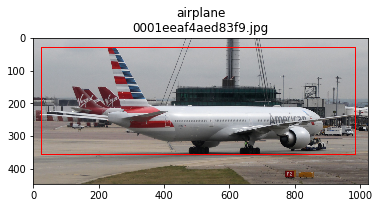

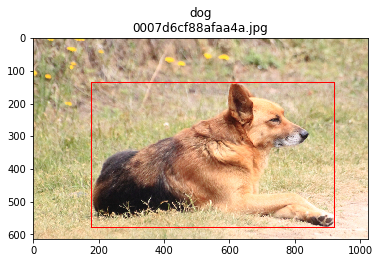

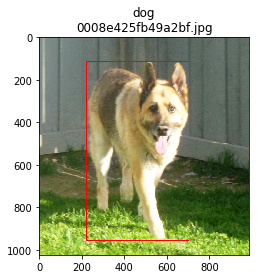

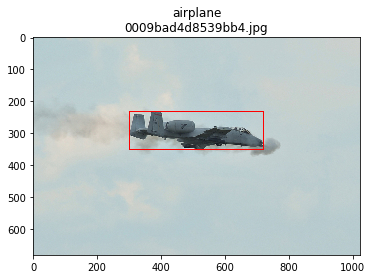

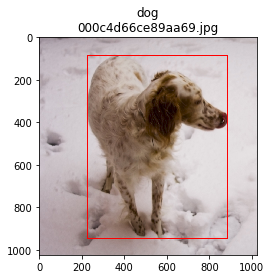

...

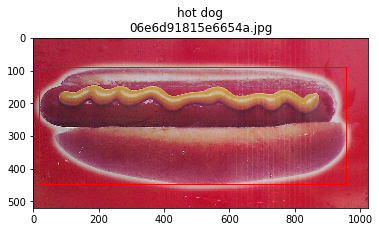

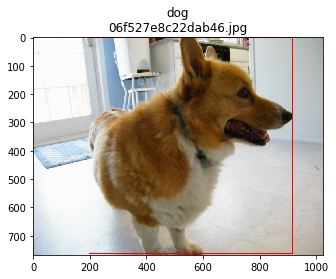

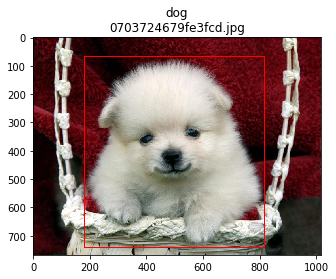

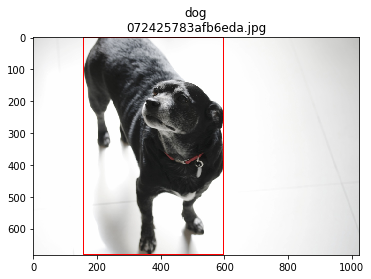

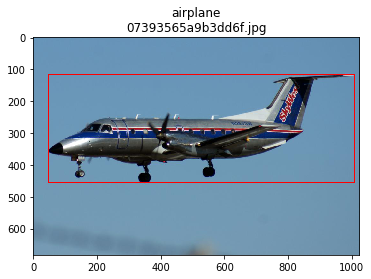

In [187]:

plot_bbox(ann_bbox, subsample_img_folder)

In [13]:
def annotations_intersecting_objects(all_ann, mapping_g_coco, intersecting_img):
    """
    all_ann: at least one object in common
    """
    inter_img_name = list(map(lambda x: x.split("/")[-1], intersecting_img))
    new_ann = {}
    for img_name in inter_img_name:
        new_ann[img_name] = {}
        for obj in all_ann[img_name].keys():
            if obj.startswith("obj_id"):
                if all_ann[img_name][obj]["label_name"] in mapping_g_coco:
                    new_ann[img_name][obj] = all_ann[img_name][obj]
    return new_ann

In [61]:
inter_obj_ann = annotations_intersecting_objects(ann_bbox, mapping_g_coco, intersecting_img)

In [62]:
len(inter_obj_ann)

17269

In [14]:
def inter_box_per_img(inter_obj_ann, nbox_min=0, nbox_max=100000):
    list_nb_obj = []
    list_relevant_img = []
    list_nb_obj_in_relevant_img = []
    
    for img_name in inter_obj_ann.keys():
        a = inter_obj_ann[img_name]
        c_obj = 0
        for obj in a.keys():
            if obj.startswith("obj_id"):
                label_name = a[obj]["label_name"]
                g = GOOGLE_CLASSES_reverse[label_name]
                c_obj += 1
        list_nb_obj.append(c_obj)
        if c_obj >= nbox_min and c_obj <= nbox_max:
            list_relevant_img.append(img_name)
            list_nb_obj_in_relevant_img.append(c_obj)
    return np.array(list_nb_obj), list_relevant_img, np.array(list_nb_obj_in_relevant_img)
                #print(COCO_CLASSES[g], g)

In [84]:
list_inter_obj, list_relevant_img = inter_box_per_img(inter_obj_ann, 
                                                      nbox_min=6,
                                                     nbox_max=10)

In [85]:
len(list_inter_obj)

17269

In [86]:
len(list_relevant_img)

825

In [87]:
np.percentile(list_inter_obj,95)

6.0

In [88]:
np.max(list_inter_obj)

84

In [89]:
plot_bbox(ann_bbox, img_folder, ["81cbf69229343b82.jpg"])

850.0

In [44]:
inter_obj_ann['e8c768cbe1172288.jpg']

{'obj_id_001': {'label_name': '/m/0k4j',
  'nbbox': [0.64444447, 0.81666666, 0.10575793, 0.29142186]},
 'obj_id_002': {'label_name': '/m/0k4j',
  'nbbox': [0.55, 0.6944444, 0.22091657, 0.3748531]},
 'obj_id_003': {'label_name': '/m/0k4j',
  'nbbox': [0.49722221, 0.61944443, 0.34312573, 0.47238544]},
 'obj_id_004': {'label_name': '/m/0k4j',
  'nbbox': [0.53333336, 0.66944444, 0.42068157, 0.5663925]},
 'obj_id_005': {'label_name': '/m/0k4j',
  'nbbox': [0.46944445, 0.5861111, 0.5640423, 0.6897767]},
 'obj_id_006': {'label_name': '/m/0k4j',
  'nbbox': [0.38333333, 0.4861111, 0.8331375, 0.93537015]}}

In [50]:
# MAIN
params = {}
params =  dict(zip(['IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction', 'IsInside'],
                          ["01" for i in range(5)]))
#params["IsOccluded"] = "01"
print("params", params)
ann_bbox = create_ann(ann_bbox_path,params = params)
print("nb total img validation",len(ann_bbox.keys()))

subsample_img_folder = "./google/google/all_params_min_max_box"

intersecting_img = intersecting_img_path(img_folder, intersecting_g_idx, ann_bbox, 
                                         #new_path=subsample_img_folder,
                                        )

nb_intersecting_img = len(intersecting_img)
print("nb intersecting_i ", nb_intersecting_img)
inter_obj_ann = annotations_intersecting_objects(ann_bbox, mapping_g_coco, intersecting_img)



list_inter_obj, list_relevant_img, list_nb_obj_relevant_img = inter_box_per_img(inter_obj_ann, 
                                                      nbox_min=3,
                                                     nbox_max=10)

print(f"nb_intersecting images (should be same as {nb_intersecting_img})", len(list_inter_obj))
print_stats(list_inter_obj, name="all intersecting img")
print_stats(list_nb_obj_relevant_img, name="relevant_img")

if 0:
    print("Copying")
    os.mkdir(subsample_img_folder)
    json.dump(inter_obj_ann,open("./google/google/annot.json" ,'w'))

    copy_img(img_folder=img_folder,new_path=subsample_img_folder, list_img_name=list_relevant_img)

params {'IsOccluded': '01', 'IsTruncated': '01', 'IsGroupOf': '01', 'IsDepiction': '01', 'IsInside': '01'}
nb total img validation 37306
nb img 17269
nb intersecting_i  17269
nb_intersecting images (should be same as 17269) 17269


******* all intersecting img
nb img 17269
mean 2.2429787480456307
50 percentile 1.0 8634.5 images
75 percentile 2.0 4317.25 images
90 percentile 4.0 1726.8999999999996 images
95 percentile 6.0 863.4500000000007 images
max 84
min 1


******* relevant_img
nb img 3673
mean 4.473999455485979
50 percentile 4.0 1836.5 images
75 percentile 5.0 918.25 images
90 percentile 7.0 367.2999999999999 images
95 percentile 8.0 183.65000000000018 images
max 10
min 3
Copying


FileExistsError: [Errno 17] File exists: './google/google/all_params_min_max_box'

In [51]:
json.dump(inter_obj_ann,open("./google/google/annot.json" ,'w'))


In [ ]:
def print_stats(liste,name="", percentiles=[50,75,90,95]):
    print("\n")
    print("*******", name)
    nb_img = len(liste)
    print("nb img", nb_img)
    print("mean", np.mean(liste))
    for x in percentiles:
        print(f"{x} percentile", np.percentile(liste,x), f"{(1-x/100)*nb_img} images")
    print("max", np.max(liste))
    print("min", np.min(liste))

In [ ]:
plot_bbox(ann_bbox, img_folder, list_relevant_img)

In [16]:
len(list_inter_obj)

17269

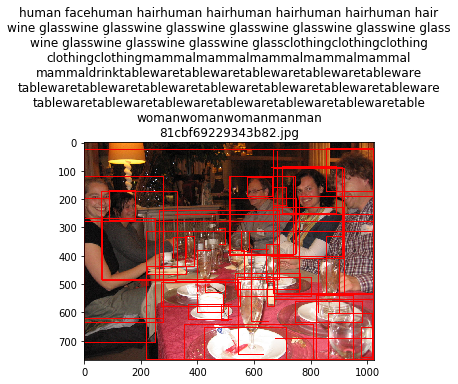

In [91]:
plot_bbox(ann_bbox, img_folder, ["81cbf69229343b82.jpg"])

In [83]:
GOOGLE_CLASSES["man"]

'/m/04yx4'

In [48]:

b = json.load(open("./google/google/annot.json" ,'r'))

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [199]:
label_name = '/m/083wq'
mapping_g_coco[label_name]

KeyError: '/m/083wq'

In [198]:

COCO_CLASSES["car"]

3

In [200]:
GOOGLE_CLASSES_reverse[label_name]

'wheel'